## Обзор данных

Выгрузим данные о заведениях общественного питания Москвы из csv-файла в датафрейм и сохраним его в переменной `places`.

In [1]:
!pip install geopy

     |████████████████████████████████| 119 kB 1.8 MB/s eta 0:00:01
     |████████████████████████████████| 40 kB 2.7 MB/s  eta 0:00:01


In [2]:
# загружаем библиотеки
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from plotly import graph_objects as go
import plotly.express as px
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
from geopy.distance import distance

In [3]:
# загружаем данные
try:
    places = pd.read_csv('/datasets/moscow_places.csv')
except FileNotFoundError:
    display('Такого файла не существует!')

Выведем 10 строчек датафрейма `places` на экран.

In [4]:
places.sample(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
6454,Шоти,кафе,"Москва, Большая Косинская улица, 27, стр. 9",Восточный административный округ,"ежедневно, 09:00–22:00",55.717469,37.857870,3.5,NaN,NaN,NaN,NaN,1,NaN
466,Шах-Даг,"бар,паб","Москва, Талдомская улица, 13",Северный административный округ,"ежедневно, 12:00–02:00",55.873123,37.520527,4.3,выше среднего,Средний счёт:от 1500 ₽,1500.0,NaN,0,105.0
2505,Планета вкуса,ресторан,"Москва, улица Сущёвский Вал, 64",Центральный административный округ,пн-пт 10:00–18:00,55.791752,37.626567,3.4,NaN,NaN,NaN,NaN,0,NaN
5951,Кинто,кафе,"Москва, улица Кржижановского, 15, корп. 1",Юго-Западный административный округ,"пн-пт 11:00–23:00; сб,вс 12:00–00:00",55.680349,37.570250,4.5,средние,Средний счёт:300–400 ₽,350.0,NaN,1,100.0
8340,Семейный Очаг,ресторан,"Москва, Шоссейная улица, 13",Юго-Восточный административный округ,"ежедневно, 12:00–00:00",55.688104,37.725197,4.3,средние,Средний счёт:до 1000 ₽,1000.0,NaN,1,98.0
3637,Лес,ресторан,"Москва, Тверской бульвар, 9",Центральный административный округ,"ежедневно, 10:00–00:00",55.759309,37.599161,4.6,высокие,Средний счёт:2000–2500 ₽,2250.0,NaN,1,50.0
4461,J'pan,кафе,"Москва, Трубная улица, 21",Центральный административный округ,"ежедневно, 10:00–23:00",55.770514,37.624847,4.7,средние,Средний счёт:800–1200 ₽,1000.0,NaN,1,40.0
5406,Ресторан Паладин,ресторан,"Москва, Новокосинская улица, 11, корп. 2",Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.734335,37.852914,4.2,NaN,NaN,NaN,NaN,0,190.0
41,Крошка Картошка,быстрое питание,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878515,37.479308,4.1,NaN,NaN,NaN,NaN,1,NaN
1016,Фуд-корт Техноград,столовая,"Москва, проспект Мира, 119, стр. 318",Северо-Восточный административный округ,пн-чт 10:00–19:00; пт-вс 10:00–21:00,55.834603,37.633464,4.2,NaN,NaN,NaN,NaN,0,NaN


**Таблица содержит следующую информацию:**
- `name` - название заведения;
- `address` - адрес заведения;
- `category` - категория заведения, например «кафе», «пиццерия» или «кофейня»;
- `hours` - информация о днях и часах работы;
- `lat` - широта географической точки, в которой находится заведение;
- `lng` - долгота географической точки, в которой находится заведение;
- `rating` - рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка - 5.0);
- `price` - категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- `avg_bill` - строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
1. «Средний счёт: 1000–1500 ₽»;
2. «Цена чашки капучино: 130–220 ₽»;
3. «Цена бокала пива: 400–600 ₽» и так далее.
- `middle_avg_bill` - число с оценкой среднего чека, которое указано только для значений из столбца `avg_bill`, начинающихся с подстроки «Средний счёт»:
1. Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
2. Если в строке указано одно число - цена без диапазона, то в столбец войдёт это число.
3. Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- `middle_coffee_cup` - число с оценкой одной чашки капучино, которое указано только для значений из столбца `avg_bill`, начинающихся с подстроки «Цена одной чашки капучино»:
1. Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
2. Если в строке указано одно число - цена без диапазона, то в столбец войдёт это число.
3. Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- `chain` - число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
1. `0` - заведение не является сетевым
2. `1` - заведение является сетевым
- `district` - административный район, в котором находится заведение, например Центральный административный округ;
- `seats` - количество посадочных мест.

Выведем основную информацию о датафрейме.

In [5]:
places.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Таблица с исходными данными содержит 14 столбцов и 8406 строк. Обратим внимание, что в столбцах `hours`, `price`, `avg_bill`, `middle_avg_bill`, `middle_coffee_cup` и `seats` имеются пропущенные значения.

In [6]:
places.describe(include='all')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406,8406,8406,8406,7870,8406.000000,8406.000000,8406.000000,3315,3816,3149.000000,535.000000,8406.000000,4795.000000
unique,5614,8,5753,9,1307,NaN,NaN,NaN,4,897,NaN,NaN,NaN,NaN
top,Кафе,кафе,"Москва, проспект Вернадского, 86В",Центральный административный округ,"ежедневно, 10:00–22:00",NaN,NaN,NaN,средние,Средний счёт:1000–1500 ₽,NaN,NaN,NaN,NaN
freq,189,2378,28,2242,759,NaN,NaN,NaN,2117,241,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,NaN,NaN,55.750109,37.608570,4.229895,NaN,NaN,958.053668,174.721495,0.381275,108.421689
std,NaN,NaN,NaN,NaN,NaN,0.069658,0.098597,0.470348,NaN,NaN,1009.732845,88.951103,0.485729,122.833396
min,NaN,NaN,NaN,NaN,NaN,55.573942,37.355651,1.000000,NaN,NaN,0.000000,60.000000,0.000000,0.000000
25%,NaN,NaN,NaN,NaN,NaN,55.705155,37.538583,4.100000,NaN,NaN,375.000000,124.500000,0.000000,40.000000
50%,NaN,NaN,NaN,NaN,NaN,55.753425,37.605246,4.300000,NaN,NaN,750.000000,169.000000,0.000000,75.000000
75%,NaN,NaN,NaN,NaN,NaN,55.795041,37.664792,4.400000,NaN,NaN,1250.000000,225.000000,1.000000,140.000000


В исходных данных нет отрицательных значений. Обратим внимание на столбец `middle_avg_bill`, а именно на аномально максимальное значение этого столбца - 35000 рублей.  Максимальное значение столбца `seats` - 1288 посадочных мест, также выглядит аномально большим.

Построим общую гистограмму для всех числовых столбцов таблицы.

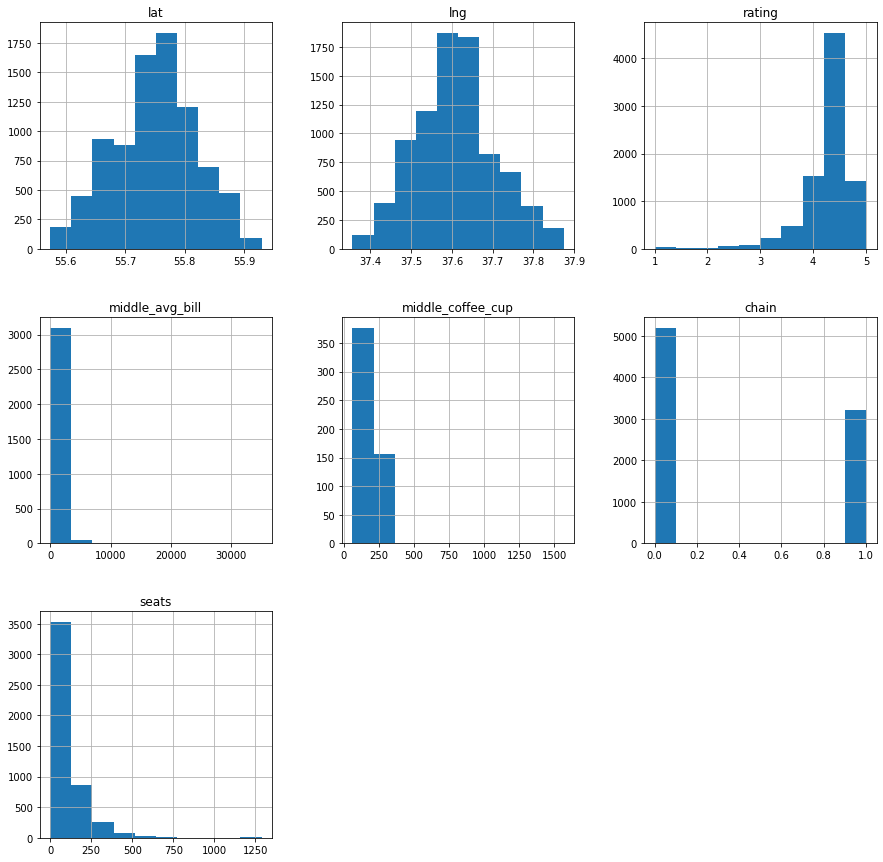

In [7]:
places.hist(figsize=(15, 15));

## Предобработка данных

### Обработка дубликатов

Выведем перечень уникальных значений столбца `name` - название заведения.

In [8]:
places['name'].unique()

array(['WoWфли', 'Четыре комнаты', 'Хазри', ..., 'Миславнес', 'Самовар',
       'Kebab Time'], dtype=object)

In [9]:
# узнаем количество уникальных значений
places['name'].nunique()

5614

Массив уникальных значений очень большой, поэтому мы не можем увидеть его целиком. Чтобы вывести все строки массива данных, воспользуемся опцией `set_option` - установки максимального количества строк на вывод. Сохраним уникальные названия заведений и их количество в переменной `unique_values`.

In [10]:
pd.set_option('display.max_rows', None)

In [11]:
unique_values = places['name'].value_counts().to_frame()

In [12]:
unique_values

,name
Кафе,189
Шоколадница,120
Домино'с Пицца,76
Додо Пицца,74
One Price Coffee,71
Яндекс Лавка,69
Cofix,65
Prime,50
Хинкальная,44
Шаурма,43


Теперь мы можем увидеть весь перечень уникальных значений. Для того, чтобы увидеть неявные дубликаты, отсортируем названия кафе в алфавитном порядке. Особое внимание обратим на наименования крупных сетевых заведений.

In [13]:
unique_values = unique_values.reset_index().sort_values(by=['index'])
unique_values

,index,name
2175,#КешбэкКафе,1
4860,+39 Pizzeria Mozzarella bar,1
5449,1 Этаж,1
1195,1-я Креветочная,1
259,10 Идеальных Пицц,3
3393,1001 Ночь,1
4722,100ловая,1
3387,100лоффка,1
2104,13,1
1204,13 Chef doner,1


Все найденные нами неявные дубликаты в названиях крупных сетевых заведений сохраним в словаре `implicit_duplicates`, где ключами будут значения, которые мы хотим заменить. Затем заменим все значения из словаря в столбце `name` методом `replace`. 

In [14]:
# словарь с неявными дубликатами
implicit_duplicates = {
    "Домино'с": "Домино'с Пицца",
    "Доминос пицца": "Домино'с Пицца",
    "Яндекс.Лавка": "Яндекс Лавка",
    "Prime cafe": "Prime",
    "Кофе-Порт": "КОФЕПОРТ",
    "Cofe Fest": "CofeFest",
    "Drive Cafe": "Drive Café"
}

# заменим значения в столбце "name"
places['name'] = places['name'].replace(implicit_duplicates)

Также мы нашли аномальное наименование - `55.709201, 37.392257` - удалим его. 

In [15]:
places = places[(places['name'] != '55.709201, 37.392257')]

Для того, чтобы уменьшить список уникальных значений, приведем все названия заведений к нижнему регистру.

In [16]:
places['name'] = places['name'].str.lower()

In [17]:
# check
places['name'].nunique()

5504

In [18]:
# check
places['name'].head().to_frame()

,name
0,wowфли
1,четыре комнаты
2,хазри
3,dormouse coffee shop
4,иль марко


Изучим данные, которые хранят в себе столбцы `category`, `district` и `price`.

In [19]:
places['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [20]:
places['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [21]:
places['price'].unique()

array([nan, 'выше среднего', 'средние', 'высокие', 'низкие'], dtype=object)

### Удаление пропусков

Выведем количество пропущенных значений для каждого столбца.

In [22]:
places.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5090
avg_bill             4589
middle_avg_bill      5256
middle_coffee_cup    7870
chain                   0
seats                3610
dtype: int64

In [23]:
# пропущенные значения бары
def pass_value_barh(data):
    missing_values = data.isna().sum()
    if missing_values.sum() == 0:
        print('Пропущенных значений не найдено')
    else:
        fig, ax = plt.subplots(figsize=(19, 6))
        ax.set_title('Количество пропущенных значений в столбцах' + "\n", fontsize = 20, color = 'Black')
        ax.set_xlabel('Количество пропусков', fontsize = 15)
        ax.set_ylabel('Наименование столбца', fontsize = 15)
        missing_values[missing_values > 0].sort_values().plot(kind='barh', ax=ax, fontsize=15, legend=False, rot=0)
        plt.show()

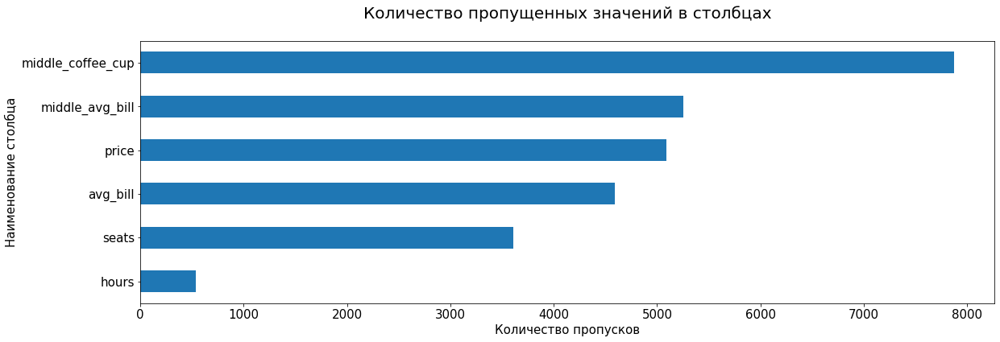

In [24]:
pass_value_barh(places)

Самое большое количество пропущенных значений содержит столбец `middle_coffee_cup` - цена одной чашки капучино. Меньше всего пропусков содержит столбец `hours` - режим работы заведений. Чтобы не искажать исходные данные оставим столбцы с пропущенными значениями без изменений.

### Обработка аномальных значений

Посмотрим на столбцы с числовыми данными - `middle_avg_bill`, `middle_coffee_cup` и `seats`.

In [25]:
# посмотрим на минимальные и максимальные значения
(
    places[['middle_avg_bill', 'middle_coffee_cup', 'seats']]
    .apply(['count', 'min', 'max'])
    .style.format("{:,.2f}")
)

,middle_avg_bill,middle_coffee_cup,seats
count,"3,149.00",535.00,"4,795.00"
min,0.00,60.00,0.00
max,"35,000.00","1,568.00","1,288.00"


In [26]:
# посмотрим на перцентили
(
    places[['middle_avg_bill', 'middle_coffee_cup', 'seats']]
    .quantile([0.01, .5, .90, .99]) 
    .style.format("{:,.2f}")
)

,middle_avg_bill,middle_coffee_cup,seats
0.01,140.00,60.00,0.00
0.5,750.00,169.00,75.00
0.9,"2,000.00",256.00,240.00
0.99,"3,750.00",309.90,625.00


 Изучим данные столбца `middle_avg_bill` - число с оценкой среднего чека.

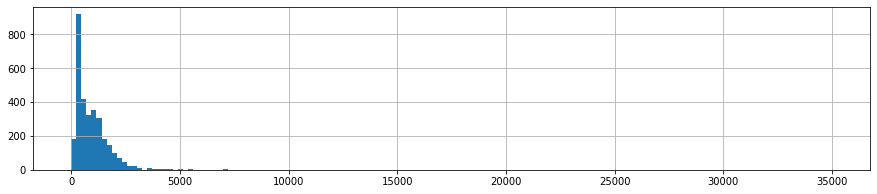

In [27]:
places.middle_avg_bill.hist(bins = 150, figsize = (15,3));

Значения среднего чека около 0 рублей являются аномально маленькими. А значения чеков около 5000 рублей практически слились с нулем и являются редкими.

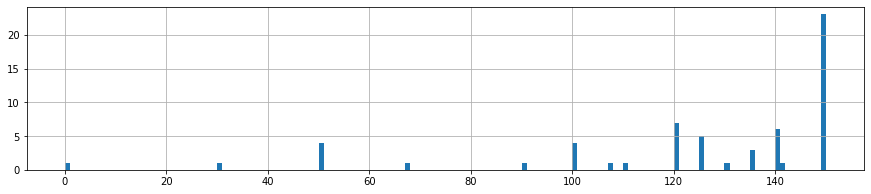

In [28]:
places.middle_avg_bill.hist(bins = 150, figsize = (15,3), range=(0, 150));

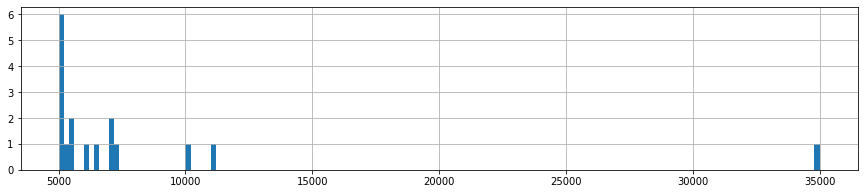

In [29]:
places.middle_avg_bill.hist(bins = 150, figsize = (15,3), range=(5000, 35000));

In [30]:
# удалим редкие значения в столбце 'middle_avg_bill'
places = places[~(places['middle_avg_bill'] > 5000) & ~(places['middle_avg_bill'] < 150)]

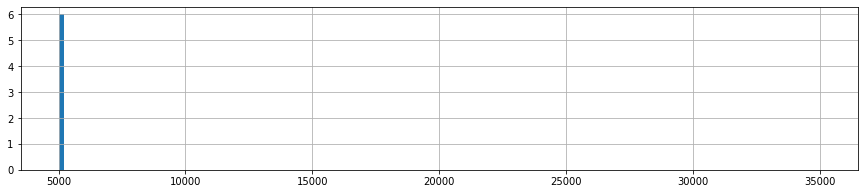

In [31]:
# check
places.middle_avg_bill.hist(bins = 150, figsize = (15,3), range=(5000, 35000));

Изучим данные столбца `middle_coffee_cup` - цена одной чашки капучино.

In [32]:
# check
(
     places[['middle_coffee_cup']]
    .apply (['count', 'min', 'max'])   
    .style.format("{:,.2f}")
)

,middle_coffee_cup
count,535.00
min,60.00
max,"1,568.00"


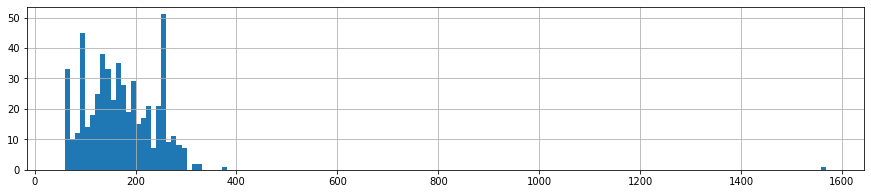

In [33]:
places.middle_coffee_cup.hist(bins = 150, figsize = (15,3));

Значения цен одной чашки капучино более 400 рублей являются редкими.

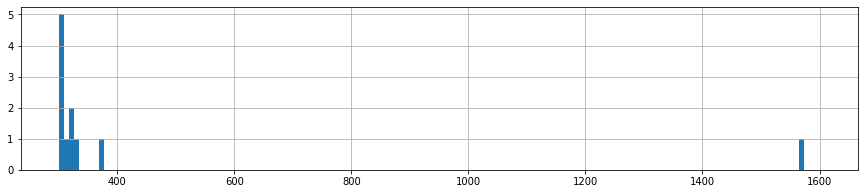

In [34]:
places.middle_coffee_cup.hist(bins = 150, figsize = (15,3), range=(300, 1600));

In [35]:
# удалим редкие значения в столбце 'middle_coffee_cup'
places = places[~(places['middle_coffee_cup'] > 400)]

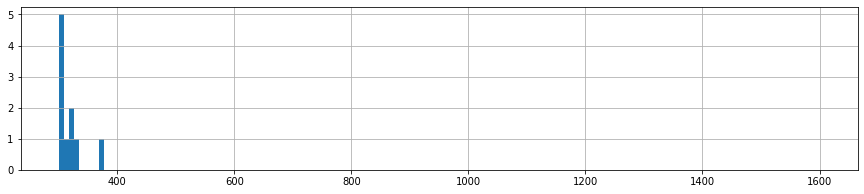

In [36]:
# check
places.middle_coffee_cup.hist(bins = 150, figsize = (15,3), range=(300, 1600));

Изучим данные столбца `seats` - количество посадочных мест.

In [37]:
# check
(
     places[['seats']]
    .apply (['count', 'min', 'max'])   
    .style.format("{:,.2f}")
)

,seats
count,"4,763.00"
min,0.00
max,"1,288.00"


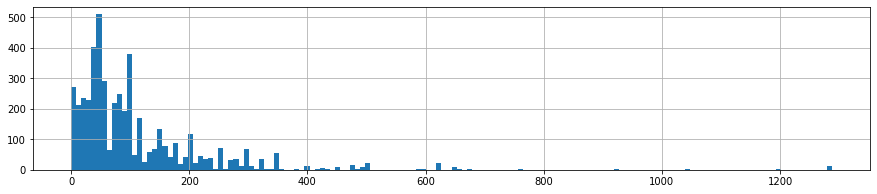

In [38]:
places.seats.hist(bins = 150, figsize = (15,3));

Значения около 0 являются аномальными, а количество посадочных мест около 700 являются редкими и аномально большими.

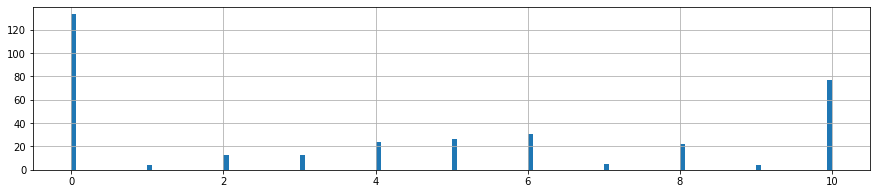

In [39]:
places.seats.hist(bins = 150, figsize = (15,3), range=(0, 10));

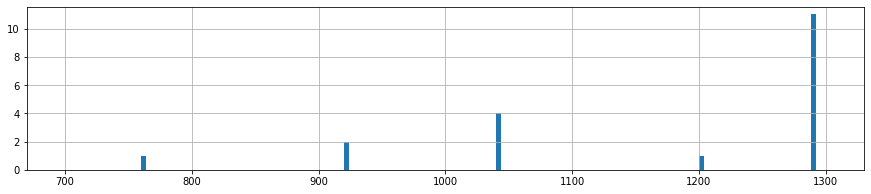

In [40]:
places.seats.hist(bins = 150, figsize = (15,3), range=(700, 1300));

In [41]:
# удалим редкие значения в столбце 'seats'
places = places[~(places['seats'] == 0) & ~(places['seats'] > 700)]

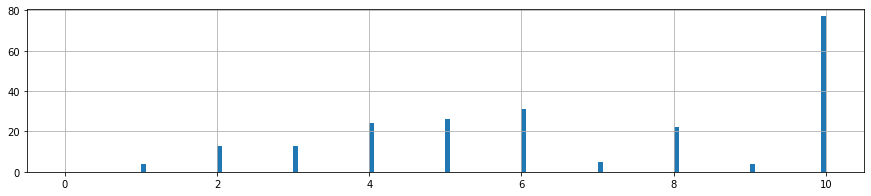

In [42]:
# check
places.seats.hist(bins = 150, figsize = (15,3), range=(0, 10));

### Создание новых столбцов

Создадим столбец `street` с названиями улиц из столбца с адресом.

In [43]:
places['address'].sample(5).to_frame()

,address
1808,"Москва, Новодмитровская улица, 5А, стр. 2"
6549,"Москва, проспект Вернадского, 86В"
6560,"Москва, проспект Вернадского, 105, корп. 3"
7974,"Москва, улица Генерала Белова, 23А"
3199,"Москва, улица Барклая, 10"


Для того, чтобы получисть название улицы, необходимо использовать метод `str.split(',')`, чтобы разбить строку адреса на список элементов, используя запятую в качестве разделителя. Затем мы выберем второй элемент из списка с помощью `str[1]`, который содержит название улицы, и удалим пробелы в начале и конце строки с помощью `str.strip()`.

In [44]:
places['street'] = places['address'].str.split(',').str[1].str.strip()

In [45]:
places.sample(2)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
6533,кувшинчик,ресторан,"Москва, улица Академика Анохина, 58",Западный административный округ,"пн-чт 12:00–23:00; пт,сб 12:00–00:00; вс 12:00...",55.650398,37.469449,4.6,NaN,NaN,NaN,NaN,0,280.0,улица Академика Анохина
139,шеф бургер,кофейня,"Москва, Дмитровское шоссе, 116Д",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.901734,37.548499,4.1,средние,Средний счёт:300 ₽,300.0,NaN,1,120.0,Дмитровское шоссе


Создадим столбец `is_24/7` с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
- логическое значение `True` - если заведение работает ежедневно и круглосуточно;
- логическое значение `False` - в противоположном случае.

In [46]:
# создадим функцию 'schedule'
def schedule (row):
    try:
        if 'ежедневно' in row and 'круглосуточно' in row:
                return True
        else:
            return False
    except:
        return False

In [47]:
places['is_24/7'] = places['hours'].apply(schedule)

In [48]:
places.sample(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
1113,кафе при азс,кафе,"Москва, Ярославское шоссе, 1, корп. 1",Северо-Восточный административный округ,NaN,55.850798,37.674517,3.5,NaN,NaN,NaN,NaN,0,500.0,Ярославское шоссе,False
4367,авокадо,кафе,"Москва, Чистопрудный бульвар, 12к4",Центральный административный округ,пн-сб 10:00–23:00; вс 12:00–23:00,55.761096,37.643383,4.6,выше среднего,Средний счёт:1000–2000 ₽,1500.0,NaN,1,NaN,Чистопрудный бульвар,False
241,алиби,"бар,паб","Москва, улица Малыгина, 1, стр. 2",Северо-Восточный административный округ,пн-чт 11:00–00:00; пт-вс 11:00–05:00,55.876348,37.701604,4.4,выше среднего,Цена бокала пива:160–499 ₽,NaN,NaN,0,40.0,улица Малыгина,False
4620,кулинарная лавка братьев караваевых,кафе,"Москва, улица Солянка, 4, стр. 4",Центральный административный округ,"ежедневно, 08:00–23:00",55.753731,37.637327,4.4,средние,NaN,NaN,NaN,1,30.0,улица Солянка,False
1889,раки beer & wine,"бар,паб","Москва, 3-я улица Ямского Поля, 9",Северный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–02:00; вс 12:00...",55.781488,37.581321,4.4,высокие,Средний счёт:2500–4000 ₽,3250.0,NaN,0,60.0,3-я улица Ямского Поля,False


## Исследовательский анализ данных

### Категории заведений

Исследуем количество объектов общественного питания по категориям.

In [49]:
cafe_categories = (places
                   .groupby('category')
                   .agg(count = ('category', 'count'))
                   .sort_values(by='count', ascending=False)
                  )
cafe_categories

,count
category,
кафе,2317
ресторан,2010
кофейня,1377
"бар,паб",755
пиццерия,622
быстрое питание,571
столовая,308
булочная,244


In [50]:
print('Общее количество заведений:', cafe_categories['count'].sum())

Общее количество заведений: 8204


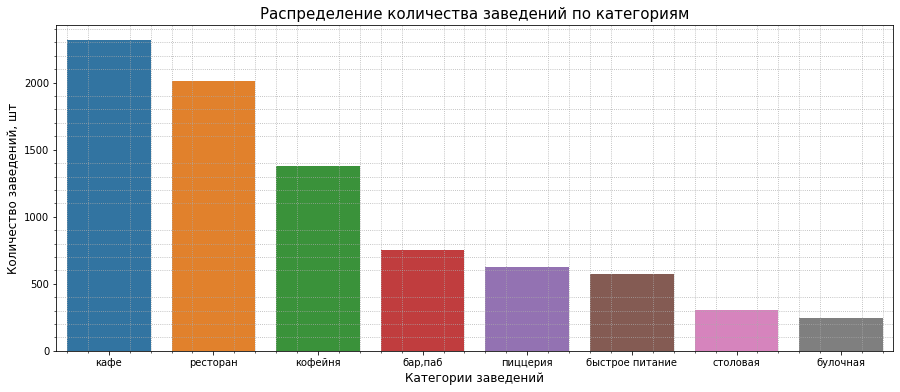

In [51]:
fig = plt.figure()

cafe_categories = cafe_categories.reset_index()

sns.barplot(data=cafe_categories, x='category', y='count');

plt.minorticks_on()
plt.grid(which='minor', color='#aaa', ls=':')

plt.title('Распределение количества заведений по категориям', fontsize = 15, color = 'k')
plt.xlabel('Категории заведений', fontsize = 12);
plt.ylabel('Количество заведений, шт', fontsize = 12);

fig.set_figwidth(15)   
fig.set_figheight(6) 

plt.show()

Мы построили диаграмму распределения количества заведений по категориям в абсолютных величинах. Теперь посмотрим на распределение заведений в относительных величинах, для этого построим круговую диаграмму.

In [52]:
# строим диаграмму с сегментами
fig = go.Figure(data=[go.Pie(labels=cafe_categories['category'], # указываем значения, которые появятся на метках сегментов
                             values=cafe_categories['count'], # указываем данные, которые отобразятся на графике
                             pull = [0.1, 0])]) # добавляем аргумент, который выделит сегмент-лидер на графике

fig.update_layout(title='Доля заведений по категориям', # указываем заголовок графика
                  width=800, # указываем размеры графика
                  height=600,
                  annotations=[dict(x=1.25, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Категории заведений',
                                    showarrow=False)])
fig.show() # выводим график

Самое большое количество объектов общественного питания относятся к категории кафе - 2317 заведений или 28,2% от общего количества заведений,  ресторанов немного меньше - 2010 заведений или 24,5%. Самое маленькое количество объектов относятся к категории - булочная - всего 244 заведения или 2,97%. 

### Количество посадочных мест по категориям

Исследуем количество посадочных мест в местах по категориям, для этого сохраним необходимые нам столбцы `category` и `seats` в переменной `seats_category`.

In [53]:
seats_category = places[['category', 'seats']]
seats_category.sample(5)

,category,seats
8177,кофейня,NaN
4534,кафе,NaN
4533,"бар,паб",86.0
36,кафе,21.0
3044,кафе,NaN


Узнаем среднее количество посадочных мест для каждой категории.

In [54]:
mean_seats_category = (seats_category
                       .groupby('category')
                       .agg(count = ('seats', 'mean'))
                       .sort_values(by='count', ascending=False)
                       .reset_index()
                       .round(0))
mean_seats_category

,category,count
0,ресторан,120.0
1,"бар,паб",117.0
2,кофейня,110.0
3,быстрое питание,103.0
4,булочная,97.0
5,кафе,97.0
6,столовая,96.0
7,пиццерия,94.0


In [55]:
# визуализируем данные
fig = px.bar(mean_seats_category, 
             x='category', 
             y='count', 
             text='count')

fig.update_xaxes(tickangle=45)

# оформляем график
fig.update_layout(title='Среднее количество посадочных мест для каждой категории',
                  xaxis_title='Категории заведений',
                  yaxis_title='Количество посадочных мест')

fig.update_traces(textposition='auto')

fig.show()

Самое большое среднее количество посадочных мест у категорий "ресторан" и "бар, паб" - 120 и 117 мест стоответственно, самое маленькое количество посадочных мест у категории "пиццерия" - 94 места. Стоит отметить, что у категорий "столовая", "кафе" и "булочная" среднее количество посадочных мест близко к категории "пиццерия".

Построим диаграмму размаха по количеству посадочных мест для каждой категории. 

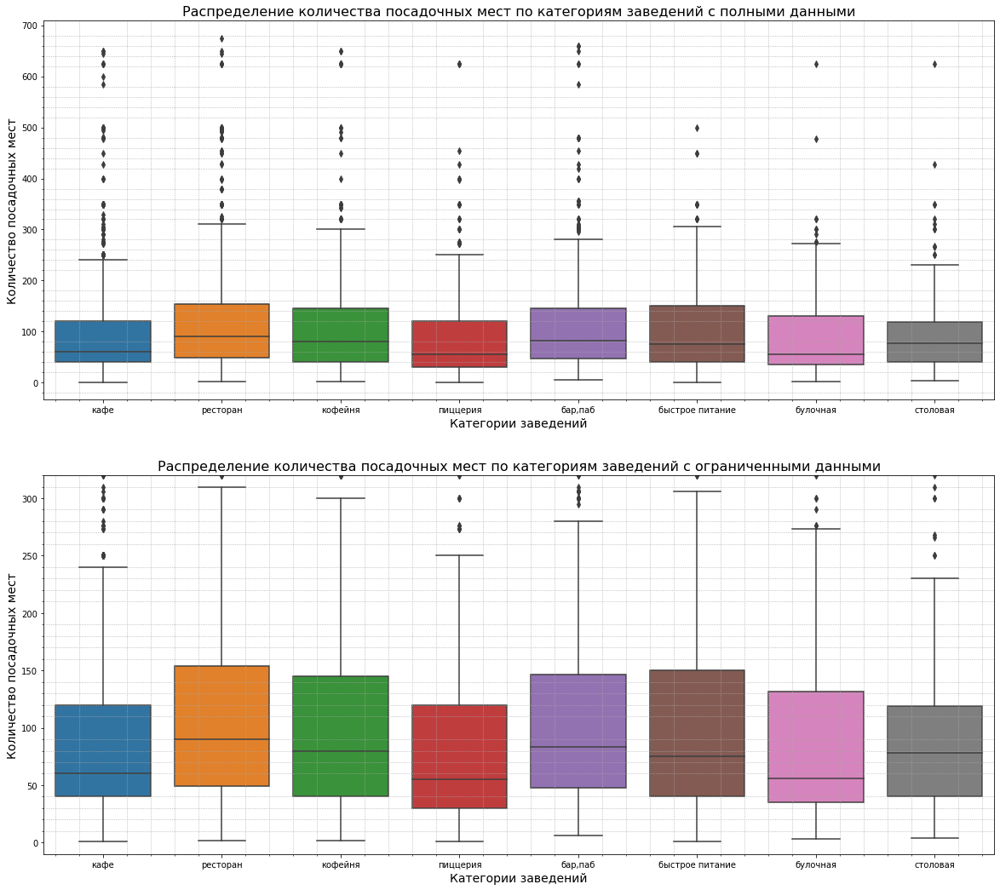

In [56]:
# устанавливаем размер фируры
plt.figure(figsize=(20, 18))

# создаем подграфики с 2 строками, 1 столбцом и начальным графиком 1
plt.subplot(2, 1, 1)
sns.boxplot(x = seats_category['category'], y = seats_category['seats']);

plt.minorticks_on()
plt.grid(which='minor', color='#aaa', ls=':')

plt.xlabel('Категории заведений', fontsize = 14)
plt.ylabel("Количество посадочных мест", fontsize = 14)
plt.title("Распределение количества посадочных мест по категориям заведений с полными данными", fontsize = 16);

# создаем подграфик 2
plt.subplot(2, 1, 2)
sns.boxplot(x = seats_category['category'], y = seats_category['seats']);

plt.minorticks_on()
plt.grid(which='minor', color='#aaa', ls=':')

plt.xlabel('Категории заведений', fontsize = 14)
plt.ylabel("Количество посадочных мест", fontsize = 14)
plt.ylim(-10, 320);
plt.title("Распределение количества посадочных мест по категориям заведений с ограниченными данными", fontsize = 16);
plt.show()

Рассмотрим график распределения посадочных мест по категориям заведений с полными данными. У всех категорий без исключения наблюдается большой диапазон выбросов по количеству посадочных мест. Особенно выделяются экстремальные выбросы у категорий: "кафе", "ресторан", "кофейня", "пиццерия" и "бар, паб" - более 640 посадочных мест. У таких категорий, как "пиццерия", "булочная" и "столовая" выбросов меньше, а экстремальные выбросы находятся на уровне около 620 посадочных мест. У категории "быстрое питание" диапазон выбросов самый маленький, а экстремальные значения находятся на уровне около 500 посадочных мест.

Рассмотрим график распределения посадочных мест по категориям заведений с ограниченными данными. Обратим внимание, что "нижний ус" у всех категорий, кроме категории "бар, паб", ограничен минимумом посадочных мест и находится около 0. У категории "бар, паб" минимальное количество посадочных мест находится около 10. Также отметим, что медиана у всех категорий, кроме "столовая", находится ближе к нижнему квартилю, это значит, что плотность распределения заведений с небольшим количеством посадочных мест выше, иными словами, преобладают заведения с небольшим количеством посадочных мест. У категории "столовая" медиана находится по середине между нижним и верхним квартилями, а значит плотность заведений по количеству посадочных мест распределена равномерно.

Самый большой размах наблюдается у категории "быстрое питание" - от 40 до 150 посадочных мест. Самый узкий диапазон наблюдается у категорий "кафе" и "столовая", большая часть значений количества посадочных мест находится в диапазоне от 40 до 120 мест.

### Cоотношение сетевых и несетевых заведений

Посмотрим на соотношение сетевых и несетевых заведений. Информацию о том, является ли заведение сетевым хранится в столбце `chain`.

In [57]:
places['chain'].value_counts().to_frame()

,chain
0,5078
1,3126


In [58]:
# строим диаграмму с сегментами
fig = go.Figure(data=[go.Pie(labels=['Несетевые', 'Сетевые'], # указываем значения, которые появятся на метках сегментов
                             values=places['chain'].value_counts(), # указываем данные, которые отобразятся на графике
                             pull = [0.1, 0])]) # добавляем аргумент, который выделит сегмент-лидер на графике

fig.update_layout(title='Cоотношение сетевых и несетевых заведений', # указываем заголовок графика
                  width=700, # указываем размеры графика
                  height=500,
                  annotations=[dict(x=1.25, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Категории заведений',
                                    showarrow=False)])
fig.show()

Количество несетевых заведений больше, чем сетевых и составляет 5078 заведений или 61,9%, количество сетевых заведений составляет 3126 или 38,1%.

### Категории заведений, которые чаще всего являются сетевыми

Узнаем, какие категории заведений чаще являются сетевыми. Сохраним наши данные в переменной `network_categories`.

In [59]:
network_categories = (places
                      .query('chain == 1')
                      .groupby(['category'])
                      .agg(count = ('category', 'count'))
                     )

# создадим столбец 'total' которые будет содержать общее количество заведений (сетевых и несетевых)
network_categories['total'] = places.groupby(['category']).agg(total = ('category', 'count'))

# создадим столбец 'percent' - доля сетевых заведений
network_categories['percent'] = (network_categories['count'] * 100 / network_categories['total']).round(2)

network_categories.sort_values(by='percent', ascending=False)

,count,total,percent
category,,,
булочная,152,244,62.30
пиццерия,324,622,52.09
кофейня,701,1377,50.91
быстрое питание,219,571,38.35
ресторан,717,2010,35.67
кафе,759,2317,32.76
столовая,87,308,28.25
"бар,паб",167,755,22.12


In [60]:
# строим столбчатую диаграмму 
fig = px.bar(network_categories.reset_index().sort_values(by='percent', ascending=False), # загружаем данные и заново их сортируем
             x='percent', # указываем столбец с данными для оси X
             y='category', # указываем столбец с данными для оси Y
             text='percent', # добавляем аргумент, который отобразит текст с информацией
             hover_data=['count'])

# оформляем график
fig.update_layout(title='Доля сетевых заведений в разбивке по категориям',
                  xaxis_title='Доля сетевых заведений, %',
                  yaxis_title='Наименование категории')

fig.show()

Чаще всего сетевыми заведениями стоновятся булочные - 62,3%. Вторую строчку по доли сетевых заведений делят между собой категории "пиццерия" и "кофейня" - 52,09 и 50,91% соответственно. Реже всего сетевыми заведениями становятся бары и пабы - всего 22,12%. 

### ТОП-15 популярных сетей в Москве

Найдём ТОП-15 сетей по количеству заведений в Москве и узнаем к какой категории заведений они относятся. 

In [61]:
top_15 = (places
          .query('chain == 1')
          .groupby(['name', 'category'])
          .agg(count = ('name', 'count'))
          .sort_values(by='count', ascending=False)
          .head(15)
         )
top_15

,,count
name,category,
шоколадница,кофейня,117
домино'с пицца,пиццерия,75
додо пицца,пиццерия,73
one price coffee,кофейня,68
яндекс лавка,ресторан,67
cofix,кофейня,64
prime,ресторан,49
кофепорт,кофейня,42
кулинарная лавка братьев караваевых,кафе,39


In [62]:
# визуализируем данные
fig = px.bar(top_15.reset_index(), 
             x='name', 
             y='count', 
             color='category',
             text='count')

fig.update_xaxes(tickangle=45)

# оформляем график
fig.update_layout(title='ТОП-15 популярных сетевых заведений в Москве',
                  xaxis_title='Наименование заведений',
                  yaxis_title='Количество заведений',
                  width=1000, 
                  height=600)

fig.update_traces(textposition='auto')

fig.show()

Посмотрим на ТОП-15 самых популярных заведений Москвы. В списке заведений есть знакомые нам сети, такие как:  "шоколадница", "додо пицца", "яндекс лавка", "теремок" и "чайхана". Самое большое количество сетевых заведений относится к категории "кофейня", и только одна сеть "буханка" относится к категории "булочная".

### Количество заведений каждой категории по районам Москвы

Узнаем и отобразим общее количество заведений и количество заведений каждой категории по районам, данные сохраним в переменной `district_category_share`.

In [63]:
# узнаем какие административные районы Москвы присутствуют в датасете
district_counts = (places['district']
                   .value_counts()
                   .to_frame()
                   .reset_index())

district_counts.columns = ['district', 'total_count']
district_counts.sort_values(by='total_count', ascending=False)

,district,total_count
0,Центральный административный округ,2225
1,Северный административный округ,885
2,Северо-Восточный административный округ,874
3,Южный административный округ,853
4,Западный административный округ,831
5,Восточный административный округ,766
6,Юго-Западный административный округ,696
7,Юго-Восточный административный округ,680
8,Северо-Западный административный округ,394


In [64]:
district_category = (places
                     .groupby(['district', 'category'])
                     .agg(count = ('name', 'count')))
district_category

count
district                                category              
Восточный административный округ        бар,паб             52
                                        булочная            23
                                        быстрое питание     67
                                        кафе               259
                                        кофейня            100
                                        пиццерия            71
                                        ресторан           155
                                        столовая            39
Западный административный округ         бар,паб             47
                                        булочная            37
                                        быстрое питание     60
                                        кафе               234
                                        кофейня            147
                                        пиццерия            70
                                        ресторан           213
                                        столовая            23
Северный административный округ         бар,паб             67
                                        булочная            36
                                        быстрое питание     54
                                        кафе               234
                                        кофейня            189
                                        пиццерия            77
                                        ресторан           188
                                        столовая            40
Северо-Восточный административный округ бар,паб             63
                                        булочная            26
                                        быстрое питание     80
                                        кафе               261
                                        кофейня            157
                                        пиццерия            67
                                        ресторан           180
                                        столовая            40
Северо-Западный административный округ  бар,паб             22
                                        булочная            12
                                        быстрое питание     29
                                        кафе               110
                                        кофейня             60
                                        пиццерия            37
                                        ресторан           108
                                        столовая            16
Центральный административный округ      бар,паб            363
                                        булочная            50
                                        быстрое питание     85
                                        кафе               461
                                        кофейня            424
                                        пиццерия           113
                                        ресторан           664
                                        столовая            65
Юго-Восточный административный округ    бар,паб             36
                                        булочная            11
                                        быстрое питание     57
                                        кафе               273
                                        кофейня             82
                                        пиццерия            55
                                        ресторан           141
                                        столовая            25
Юго-Западный административный округ     бар,паб             38
                                        булочная            26
                                        быстрое питание     58
                                        кафе               231
                                        кофейня             95
                                        пиццерия            63
                         

In [65]:
district_category = district_category.reset_index()

# объединим таблицу "district_counts" и "district_category"
district_category_share = pd.merge(district_category, district_counts, on='district')

# добавим столбец 'share', который будет содержать долю категорий для каждого района
district_category_share['share'] = (district_category_share['count'] * 100 / district_category_share['total_count']).round(2)

district_category_share

,district,category,count,total_count,share
0,Восточный административный округ,"бар,паб",52,766,6.79
1,Восточный административный округ,булочная,23,766,3.00
2,Восточный административный округ,быстрое питание,67,766,8.75
3,Восточный административный округ,кафе,259,766,33.81
4,Восточный административный округ,кофейня,100,766,13.05
5,Восточный административный округ,пиццерия,71,766,9.27
6,Восточный административный округ,ресторан,155,766,20.23
7,Восточный административный округ,столовая,39,766,5.09
8,Западный административный округ,"бар,паб",47,831,5.66
9,Западный административный округ,булочная,37,831,4.45


In [66]:
# визуализируем данные таблицы "district_category"
fig = px.bar(district_category_share.sort_values(by='total_count'), 
             x='count', 
             y='district', 
             color='category',
             hover_data=['count', 'share', 'total_count'])

# оформляем график
fig.update_layout(title='Распределение заведений каждой категории по районам Москвы',
                  xaxis_title='Количество заведений',
                  yaxis_title='Административные районы',
                  width=1200, 
                  height=500)


fig.show()

В Москве девять округов, самое большое количество заведений находится в Центральном административном округе - 2225 заведений, самое маленькое количество в Северо-Западном административном округе - 394 заведений. В каждом районе самый большой процент заведений относятся к категориям "ресторан" и "кафе, меньше всего относятся к категориям "столовая" и "булочная".

### Распределение средних рейтингов по категориям заведений

Посмотрим на распределение средних рейтингов по категориям заведений.

In [67]:
rating_category = places[['category', 'rating']]
rating_category.sample(5)

,category,rating
4520,ресторан,4.4
2605,быстрое питание,4.3
7012,кафе,4.0
3570,ресторан,4.4
916,кафе,4.1


In [68]:
# визуализируем данные таблицы "rating_category"
fig = px.box(rating_category, x="category", y="rating", color='category')

# оформляем график
fig.update_layout(title='Распределение средних рейтингов по категориям заведений',
                  xaxis_title='Категории заведений',
                  yaxis_title='Средний рейтинг заведения')

fig.show()

Глядя на график, мы можем разбить распределение рейтингов на четыре группы и сделать следующие выводы: 

- **Первая группа.** Распределение средних рейтингов категорий `кафе` и `быстрое питание` похожи: большое число выбросов, "верхний ус" категории `кафе` упирается в максимальное значание рейтинга - 5.0, "верхний ус" категории `быстрое питание` - 4.9, "нижний ус" - 3.4 и 3.3 соответтсвенно. Основные значения рейтинга категории `кафе` лежат в диапазоне 4 - 4.4, а категории `быстрое питание` в диапазоне 3.9 - 4.3. Медиана у категории `кафе` находится по середине между верхним и нижнем квартилем, это значит, что значения рейтинга распределены равномерно. А вот медиана категории `быстрое питание` смещена в сторону верхнего квартиля, значит преобладают значения с более высокими оценками.


- **Вторая группа.** Распределение средних рейтингов категорий `ресторан` и `бар, паб` похожи: размер "размаха усов" одинаковый, "верхний ус" категории `ресторан` - 4.9, "верхний ус" категории `бар, паб` упирается в максимальное значание рейтинга - 5.0, "нижний ус" - 3.8 и 3.9 соответственно. Основные значения рейтинга категории `ресторан` лежат в диапазоне 4.2 - 4.5, а категории `бар, паб` в диапазоне 4.3 - 4.6. Медиана обеих категорий смещена в сторону нижнего квартиля, значит преобладают оценки с более низкими оценками. Количество выбросов у категории `ресторан` больше.


- **Третья группа.** Распределение средних рейтингов категорий `кофейня` и `столовая` похожи: количество выбросов, размер "размаха усов" одинаковый, "верхний ус" категориий - 4.8, "нижний ус" - 3.7. Основные значения рейтингов лежат в диапазоне 4.1 - 4.4. Медиана категории `кофейня` смещена в сторону верхнего квартиля, значит преобладают значения с более высокими оценками. А вот медиана категории `столовая` находится по середине между верхнем и нижнем квартилем, это значит, что значения рейтинга распределены равномерно.


- **Четвертая группа.** Распределение средних рейтингов категорий `пиццерия` и `булочная` похожи: размер "размаха усов" одинаковый, "верхний ус" категориий - 4.7, "нижний ус" - 3.9. Основные значения рейтингов лежат в диапазоне 4.2 - 4.4. Медиана обеих категорий находится по середине между верхнем и нижнем квартилем, это значит, что значения рейтинга распределены равномерно.

### Картограмма со средним рейтингом заведений каждого района

Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле `/datasets/admin_level_geomap.geojson`. 

Для каждого округа посчитаем медианный рейтинг зведений, которые находятся на его территории:

In [69]:
rating_district = (places
                   .groupby('district', as_index=False)['rating']
                   .agg('mean')
                   .sort_values(by='rating', ascending=False)
                   .round(1))
rating_district

,district,rating
5,Центральный административный округ,4.4
2,Северный административный округ,4.2
4,Северо-Западный административный округ,4.2
8,Южный административный округ,4.2
1,Западный административный округ,4.2
0,Восточный административный округ,4.2
7,Юго-Западный административный округ,4.2
3,Северо-Восточный административный округ,4.1
6,Юго-Восточный административный округ,4.1


In [70]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
map_Moscow = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_district,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='PuRd',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(map_Moscow)

# выводим карту
map_Moscow

Самый высокий средний рейтинг заведений в Центральном административном округе Москвы - 4,4. Самый низкий средний рейтинг заведений в двух районах, в Северо-Восточном и Юго-Восточном административных округах - 4,1.

### Отображение всех заведений на карте 

Отобразим все заведения нашего датасета `places` на карте с помощью кластеров средствами библиотеки `folium`.

In [71]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
places.apply(create_clusters, axis=1)

# выводим карту
m

Мы отобразили на карте Москвы все заведения нашего датасета `places`. При нажатии на маркер места всплывает окошко с названием и рейтингом заведения.

### ТОП-15 улиц по количеству заведений

Найдём ТОП-15 улиц по количеству заведений. Построим график распределения количества заведений и их категорий по этим улицам.

In [72]:
top_15_street = (places
                 .groupby(['street'])
                 .agg(total = ('name', 'count'))
                 .sort_values(by='total', ascending=False)
                 .reset_index()
                 .head(15))

top_15_street

,street,total
0,проспект Мира,184
1,Профсоюзная улица,117
2,Ленинский проспект,107
3,проспект Вернадского,96
4,Ленинградский проспект,95
5,Дмитровское шоссе,86
6,Каширское шоссе,76
7,Варшавское шоссе,74
8,Ленинградское шоссе,70
9,МКАД,65


In [73]:
# создадим таблицу "street_category", которая будет содержать адрес, категорию заведения и их количество
street_category = (places
                   .groupby(['street', 'category'])
                   .agg(count = ('category', 'count'))
                   .reset_index())

street_category.head()

,street,category,count
0,1-й Автозаводский проезд,кафе,1
1,1-й Балтийский переулок,ресторан,1
2,1-й Варшавский проезд,кафе,1
3,1-й Вешняковский проезд,кафе,1
4,1-й Волоколамский проезд,кафе,1


In [74]:
# объединим таблицу "top_15_street" и "street_category" по столбцу 'street'
top_15_street_category = pd.merge(top_15_street, street_category, on='street')

top_15_street_category

,street,total,category,count
0,проспект Мира,184,"бар,паб",12
1,проспект Мира,184,булочная,4
2,проспект Мира,184,быстрое питание,21
3,проспект Мира,184,кафе,53
4,проспект Мира,184,кофейня,36
5,проспект Мира,184,пиццерия,11
6,проспект Мира,184,ресторан,45
7,проспект Мира,184,столовая,2
8,Профсоюзная улица,117,"бар,паб",6
9,Профсоюзная улица,117,булочная,4


In [75]:
# добавим столбец 'share', который будет содержать долю категорий заведений для каждой улицы
top_15_street_category['share'] = \
(top_15_street_category['count'] * 100 / top_15_street_category['total']).round(0)

In [76]:
# визуализируем данные таблицы "district_category"
fig = px.bar(top_15_street_category.sort_values(by='total', ascending=False), 
             x='street', 
             y='count', 
             color='category',
             hover_data=['count', 'share', 'total'],
#             text='total',
             barmode='relative')

# оформляем график
fig.update_layout(title='Распределение заведений каждой категории по ТОП-15 улицам Москвы',
                  xaxis_title='Наименование улицы',
                  yaxis_title='Количество заведений',
                  width=1000, 
                  height=600)

# fig.update_traces(textposition='inside')

fig.show()

Самой популярной улицей является `проспект Мира` - 184 заведения, из которых 28,8% относятся к категории `кафе`. Замыкает наш список ТОП-15 - `Алтуфьевское шоссе` - 47 заведений, из которых 27,66% также относятся к категории `кафе`. В списке ТОП-15 улиц Москвы меньше всего есть заведений с категорией `булочная`, а самой популярной категорией является `кафе`.

### Улицы, на которых находится только один объект общепита

Найдём улицы, на которых находится только один объект общепита и узнаем об этих заведениях по-больше.

In [77]:
# создадим переменную "place" в которой сохраним столбцы с информацией, которую мы хотим узнать
place = places[['name', 'category', 'district', 'hours', 'seats', 'rating', 'price', 'chain', 'street']]

# в переменной "one_place" сохраним улицы, на которых находится только один объект общепита
one_place = (place
             .groupby(['street'])
             .agg(total = ('name', 'count'))
             .reset_index()
             .query('total == 1')
             .sort_values(by='street'))

# объединим таблицы "place" и "one_place" по столбцу 'street'
street_one_place = pd.merge(one_place, place, on='street')

# обновим индексы в таблице "street_one_place"
street_one_place = street_one_place.reset_index(drop=True)

street_one_place

,street,total,name,category,district,hours,seats,rating,price,chain
0,1-й Автозаводский проезд,1,чайхана азия,кафе,Южный административный округ,"ежедневно, круглосуточно",20.0,4.2,средние,1
1,1-й Балтийский переулок,1,хуан хэ,ресторан,Северный административный округ,"ежедневно, 12:00–22:00",60.0,4.4,высокие,0
2,1-й Варшавский проезд,1,колизей,кафе,Южный административный округ,пн-чт 10:00–00:00; пт-вс 10:00–05:00,NaN,4.0,NaN,0
3,1-й Вешняковский проезд,1,deli by shell,кафе,Юго-Восточный административный округ,NaN,NaN,3.4,NaN,0
4,1-й Голутвинский переулок,1,shelby,"бар,паб",Центральный административный округ,пн-пт 09:00–20:00,22.0,4.1,средние,0
5,1-й Грайвороновский проезд,1,домашняя кухня,"бар,паб",Юго-Восточный административный округ,"ежедневно, 10:00–02:00",NaN,3.9,средние,0
6,1-й Дербеневский переулок,1,жаровня-офис,кафе,Южный административный округ,пн-пт 08:30–19:30,NaN,4.2,NaN,0
7,1-й Земельный переулок,1,арти,ресторан,Центральный административный округ,"ежедневно, 12:00–00:00",NaN,4.9,NaN,0
8,1-й Капотнинский проезд,1,халал,кафе,Юго-Восточный административный округ,"ежедневно, 08:00–20:00",NaN,3.6,NaN,1
9,1-й Кирпичный переулок,1,вкус life,кафе,Восточный административный округ,пн-пт 10:00–21:00,10.0,4.1,выше среднего,0


Всего у нас 455 улиц, но которых находится только один объект общепита.

In [78]:
# узнаем общую информацию об этих заведениях
street_one_place.describe(include='all')

,street,total,name,category,district,hours,seats,rating,price,chain
count,455,455.0,455,455,455,428,152.000000,455.000000,182,455.000000
unique,455,NaN,400,8,9,179,NaN,NaN,4,NaN
top,Бесединское шоссе,NaN,кафе,кафе,Центральный административный округ,"ежедневно, круглосуточно",NaN,NaN,средние,NaN
freq,1,NaN,20,160,142,30,NaN,NaN,122,NaN
mean,NaN,1.0,NaN,NaN,NaN,NaN,61.184211,4.241319,NaN,0.281319
std,NaN,0.0,NaN,NaN,NaN,NaN,47.689312,0.458457,NaN,0.450138
min,NaN,1.0,NaN,NaN,NaN,NaN,1.000000,1.000000,NaN,0.000000
25%,NaN,1.0,NaN,NaN,NaN,NaN,30.000000,4.100000,NaN,0.000000
50%,NaN,1.0,NaN,NaN,NaN,NaN,45.000000,4.300000,NaN,0.000000
75%,NaN,1.0,NaN,NaN,NaN,NaN,80.000000,4.500000,NaN,1.000000


Среди "одиноких" заведений чаще всего они принадлежат к категории `кафе`, всего таких заведений - 400, большая часть находится в Центральном административном округе, в основном они работают ежедневно и круглосуточно, цены в основном средние и большая часть из них несетевых. 

#### Количество объектов общественного питания по категориям для улиц с одним заведением

In [79]:
street_one_cafe_categories = (street_one_place
                              .groupby('category')
                              .agg(count = ('category', 'count'))
                              .sort_values(by='count', ascending=False)
                              .reset_index())
street_one_cafe_categories

,category,count
0,кафе,160
1,ресторан,92
2,кофейня,83
3,"бар,паб",39
4,столовая,37
5,быстрое питание,21
6,пиццерия,16
7,булочная,7


In [80]:
# строим диаграмму с сегментами
fig = go.Figure(data=[go.Pie(labels=street_one_cafe_categories['category'], 
                             values=street_one_cafe_categories['count'], 
                             pull = [0.1, 0])]) 

fig.update_layout(title='Число заведений по категориям для улиц с одним заведением',
                  width=800, 
                  height=600,
                  annotations=[dict(x=1.25, 
                                    y=1.05,
                                    text='Категории заведений',
                                    showarrow=False)])
fig.show() # выводим график

Самое большое количество объектов общественного питания относятся к категории "кафе" - 160 заведений или 35,2% от общего количества заведений для улиц с одним объектом. Самое маленькое количество объектов относятся к категории - булочная - всего 7 заведения или 1,54%. 

#### Количество посадочных мест по категориям для улиц с одним заведением

Узнаем среднее количество посадочных мест для каждой категории.

In [81]:
mean_seats_category_street_one_place = (street_one_place
                                        .groupby('category')
                                        .agg(count = ('seats', 'mean'))
                                        .sort_values(by='count', ascending=False)
                                        .reset_index()
                                        .round(0))
mean_seats_category_street_one_place

,category,count
0,столовая,80.0
1,булочная,74.0
2,ресторан,74.0
3,быстрое питание,66.0
4,"бар,паб",66.0
5,пиццерия,60.0
6,кофейня,50.0
7,кафе,46.0


In [82]:
# визуализируем данные
fig = px.bar(mean_seats_category_street_one_place, 
             x='category', 
             y='count', 
             text='count')

fig.update_xaxes(tickangle=45)

# оформляем график
fig.update_layout(title='Среднее количество посадочных мест каждой категории для улиц с одним заведением',
                  xaxis_title='Категории заведений',
                  yaxis_title='Количество посадочных мест')

fig.update_traces(textposition='auto')

fig.show()

Самое большое среднее количество посадочных мест у категории "столовая" - 80 мест, самое маленькое количество посадочных мест у категории "кафе" - 46 мест.

#### Соотношение сетевых и несетевых заведений для улиц с одиним объектом общественного питания

Посмотрим на соотношение сетевых и несетевых заведений.

In [83]:
street_one_place['chain'].value_counts().to_frame()

,chain
0,327
1,128


In [84]:
# строим диаграмму с сегментами
fig = go.Figure(data=[go.Pie(labels=['Несетевые', 'Сетевые'], 
                             values=street_one_place['chain'].value_counts(), 
                             pull = [0.1, 0])])

fig.update_layout(title='Cоотношение сетевых и несетевых заведений для улиц с одним объектом', 
                  width=700,
                  height=500,
                  annotations=[dict(x=1.25, 
                                    y=1.05,
                                    text='Категории заведений',
                                    showarrow=False)])
fig.show()

### Картограмма со средним чеком заведений каждого района

Построим фоновую картограмму (хороплет) со средним чеком заведений каждого района. Для каждого округа посчитаем медиану среднего чека заведений, которые находятся на его территории:

In [85]:
middle_avg_bill_district = (places
                            .groupby('district', as_index=False)['middle_avg_bill']
                            .agg('median')
                            .sort_values(by='middle_avg_bill', ascending=False)
                            .round(1))
middle_avg_bill_district

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,650.0
0,Восточный административный округ,600.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,475.0


In [86]:
# создаём карту Москвы
map_Moscow_bill = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=middle_avg_bill_district,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.8,
    legend_name='Средний чек заведений по районам',
).add_to(map_Moscow_bill)

# выводим карту
map_Moscow_bill

Самый высокий средний чек заведений в Центральном и Западном административных округах Москвы - 1000 рублей. Самый низкий средний чек заведений в Юго-Восточном административном округе - 475 рублей, Северо-Восточном и Южном административных округах - 500 рублей.

Узнаем как удалённость от центра влияет на цены в заведениях. У нас есть координаты местоположения заведений и координаты центра Москвы, следовательно мы можем рассчитать расстояние до центра. Для этого нам понадобиться библиотека `geopy`, которая содержит готовые функции для работы с геоданными. Мы сможем использовать функцию `distance` из модуля `geopy.distance` для вычисления расстояния между точками, заданными координатами широты и долготы.

In [87]:
# координаты центра Москвы
city_center = (55.751244, 37.618423)

# вычисляем расстояние от каждой точки до центра города
places['distance_center'] = \
places.apply(lambda row: distance(city_center, (row['lat'], row['lng'])).km, axis=1).round(0)

places.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7,distance_center
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False,17.0
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False,16.0
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False,16.0
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False,17.0
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False,18.0


In [88]:
middle_avg_bill_center = (places
                          .groupby('distance_center', as_index=False)['middle_avg_bill']
                          .agg('mean'))

middle_avg_bill_center.head()

,distance_center,middle_avg_bill
0,0.0,1175.000000
1,1.0,1387.283951
2,2.0,1336.009375
3,3.0,1042.500000
4,4.0,1029.479554


In [89]:
fig = px.line(middle_avg_bill_center, 
                 x='distance_center', 
                 y='middle_avg_bill')  
                 
# оформляем график
fig.update_layout(title='Зависимость среднего чека заведения от расстояния до центра',
                   xaxis_title='Расстояние до центра, км',
                   yaxis_title='Средний чек, км')

fig.show()

In [90]:
middle_avg_bill_center['distance_center'].corr(middle_avg_bill_center['middle_avg_bill'])

-0.8060732680069185

Коэффициент корреляции равен -0,81. Средний чек заведений зависит от расстояния до центра, чем меньше расстояние до центра, тем больше средний чек.

Попробуем объяснить провал на 6, 10 и 17 километре. Посмотрим какое количество заведений присутствует на каждом километре.

In [91]:
middle_places_center = (places
                        .groupby('distance_center', as_index=False)['name']
                        .agg('count'))

fig = px.line(middle_places_center, 
              x='distance_center', 
              y='name')  
                 
# оформляем график
fig.update_layout(title='Зависимость количества заведений от расстояния до центра',
                   xaxis_title='Растояние до центра, км',
                   yaxis_title='Количество заведений')

fig.show()

На графике мы видим, что на 6 и 10 километре наблюдаются "провалы" по количеству заведений, следовательно это и повлияло на средний чек заведений на этих расстояниях. А вот "провал" среднего чека на 17 километре, мы объяснить не можем, так как количество заведений после 13 километра начинают падать. Вероятно, "провал" среднего чека на 17 километре связан с неполнотой наших данных.

## Детализирование исследования: открытие кофейни

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта - открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Попробуем определить, осуществима ли мечта клиентов.

### Количество кофеен и особенности их расположения

Узнаем количество кофеен в нашем датасете. Посмотрим как они распределяются по районам. Для этого создадим переменную `coffee_house`, в которой сохраним информацию только о кофейнях.

In [92]:
coffee_house = places.query('category == "кофейня"').reset_index(drop=True)
coffee_house.tail(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7,distance_center
1372,назис пури,кофейня,"Москва, Люблинская улица, 61",Юго-Восточный административный округ,"ежедневно, 09:00–22:00",55.684103,37.738588,4.5,NaN,NaN,NaN,NaN,0,NaN,Люблинская улица,False,11.0
1373,квадрат кофе,кофейня,"Москва, Волгоградский проспект, 73, стр. 1",Юго-Восточный административный округ,"пн-пт 08:30–21:30; сб,вс 09:00–21:30",55.709710,37.744450,4.2,NaN,Цена чашки капучино:100–220 ₽,NaN,160.0,0,206.0,Волгоградский проспект,False,9.0
1374,шоколад имбирь корица,кофейня,"Москва, Грайвороновская улица, 23",Юго-Восточный административный округ,пн-пт 09:30–19:30,55.721213,37.740755,4.1,NaN,NaN,NaN,NaN,0,NaN,Грайвороновская улица,False,8.0
1375,cafio,кофейня,"Москва, Новохохловская улица, 49",Юго-Восточный административный округ,"пн-пт 07:00–22:00; сб,вс 07:00–21:00",55.724357,37.716415,4.7,NaN,Цена чашки капучино:80–120 ₽,NaN,100.0,0,NaN,Новохохловская улица,False,7.0
1376,практика кофе,кофейня,"Москва, Чонгарский бульвар, 26А, корп. 1",Юго-Западный административный округ,"пн-пт 08:00–22:00; сб,вс 09:00–22:00",55.654289,37.600722,4.4,NaN,NaN,NaN,NaN,0,55.0,Чонгарский бульвар,False,11.0


In [93]:
# узнаем количество кофеен
print('Количество кофеен в нашем датасете:', len(coffee_house))

Количество кофеен в нашем датасете: 1377


Узнаем соотношение количества кофеен к общему количеству заведений общественного питания. 

In [94]:
places['category_name'] = 'другая категория'
places.loc[places['category'] == 'кофейня', 'category_name'] = 'кофейня'

places.sample(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7,distance_center,category_name
2101,prime,ресторан,"Москва, 3-я улица Ямского Поля, 2к13",Северный административный округ,пн-пт 08:00–20:00,55.781379,37.582584,3.9,NaN,NaN,NaN,NaN,1,NaN,3-я улица Ямского Поля,False,4.0,другая категория
5682,иван дурдинъ,"бар,паб","Москва, Мичуринский проспект, 8с2",Западный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–02:00; вс 12:00...",55.705574,37.511041,4.6,NaN,NaN,NaN,NaN,0,NaN,Мичуринский проспект,False,8.0,другая категория
3731,кулинарная лавка братьев караваевых,кафе,"Москва, 1-я Брестская улица, 29",Центральный административный округ,"ежедневно, 08:00–23:00",55.771704,37.590909,4.3,средние,Средний счёт:350 ₽,350.0,NaN,1,45.0,1-я Брестская улица,False,3.0,другая категория
3432,френч бистро,быстрое питание,"Москва, Столярный переулок, 3к5",Центральный административный округ,пн-пт 09:00–17:00,55.763524,37.569291,4.1,средние,Средний счёт:350 ₽,350.0,NaN,0,NaN,Столярный переулок,False,3.0,другая категория
1441,coffeeizm,кофейня,"Москва, улица Космонавта Волкова, 6А",Северный административный округ,пн-пт 09:00–18:00,55.815522,37.513148,4.3,NaN,Средний счёт:300–350 ₽,325.0,NaN,0,180.0,улица Космонавта Волкова,False,10.0,кофейня


In [95]:
share_coffee_house = places['category_name'].value_counts().to_frame().reset_index()
share_coffee_house

,index,category_name
0,другая категория,6827
1,кофейня,1377


In [96]:
# строим диаграмму с сегментами для таблицы "share_coffee_house"
fig = go.Figure(data=[go.Pie(labels=share_coffee_house['index'],
                             values=share_coffee_house['category_name'],
                             pull = [0.1, 0])])
fig.update_layout(title='Соотношение кофеен и других категорий общественного питания', 
                  width=700, 
                  height=500,
                  annotations=[dict(x=1.25, 
                                    y=1.05,
                                    text='Категория заведения',
                                    showarrow=False)])
fig.show()

Узнаем в каких районах кофеен больше всего.

In [97]:
district_coffee_house = (coffee_house
                         .groupby('district', as_index=False)['name']
                         .agg('count')
                         .sort_values(by='name')
                        )
district_coffee_house.columns = ['district', 'count']

district_coffee_house['share'] = \
(district_coffee_house['count'] * 100 / district_coffee_house['count'].sum()).round(1)
district_coffee_house

,district,count,share
4,Северо-Западный административный округ,60,4.4
6,Юго-Восточный административный округ,82,6.0
7,Юго-Западный административный округ,95,6.9
0,Восточный административный округ,100,7.3
8,Южный административный округ,123,8.9
1,Западный административный округ,147,10.7
3,Северо-Восточный административный округ,157,11.4
2,Северный административный округ,189,13.7
5,Центральный административный округ,424,30.8


In [98]:
# визуализируем данные таблицы "district_coffee_house"
fig = px.bar(district_coffee_house, 
             x='count', 
             y='district', 
             text='count',
             hover_data=['share'])

# оформляем график
fig.update_layout(title='Распределение кофеен по районам Москвы',
                  xaxis_title='Количество заведений',
                  yaxis_title='Административные районы')

fig.show()

#### Рекомендация

*`Самым перспективным районом для открытия кофейни является Северо-Западный административный округ, в этом районе самое маленькое количество кофеен - всего 60 заведений или 4,4% от общего количества кофеен.`*

Помотрим, как количество кофеен меняется в зависимости от расстояния до центра.

In [99]:
distance_coffee_house = (coffee_house
                        .groupby('distance_center', as_index=False)['name']
                        .agg('count'))

distance_coffee_house.columns = ['distance_center', 'count']

distance_coffee_house.head()

,distance_center,count
0,1.0,42
1,2.0,111
2,3.0,155
3,4.0,111
4,5.0,97


In [100]:
# визуализируем данные таблицы "distance_coffee_house"
fig = px.line(distance_coffee_house, 
              x='distance_center', 
              y='count')  
                 
# оформляем график
fig.update_layout(title='Зависимость количества кофеен от расстояния до центра',
                   xaxis_title='Расстояние до центра, км',
                   yaxis_title='Количество заведений')

fig.show()

Мы можем сделать следующий вывод: чем меньше расстояние до центра, тем больше кофеен.

Узнаем, какое количество кофеен находится в Северно-Западном регионе в 10 километрах от центра города.

In [101]:
location_coffee_house = (coffee_house
                         .query('district == "Северо-Западный административный округ" and \
                         distance_center == 10')
                        )

print('Количество кофеен в Северо-Западном административном округе в 10 километрах от центра города:', len(location_coffee_house))

Количество кофеен в Северо-Западном административном округе в 10 километрах от центра города: 8


#### Рекомендация

*`На 10 километре от центра наблюдается "провал" по количеству кофеен. На таком расстоянии от центра находится 51 заведение. Открытие ещё одного кафе, там явно бы не помешало. С учётом первой рекомендации, если мы выбираем Северо-Западный регион и расстояние до центра 10 километров, то количество кофеен сокращается до 8 заведений.`*

### Количество круглосуточных кофеен

Узнаем, есть ли в нашем датасете кофейни, которые работают круглосуточно.

In [102]:
coffee_house.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7,distance_center
0,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False,17.0
1,в парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк Левобережный,False,17.0
2,9 bar coffee,кофейня,"Москва, Коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,NaN,NaN,NaN,NaN,1,46.0,Коровинское шоссе,False,16.0
3,cofefest,кофейня,"Москва, улица Маршала Федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,1,NaN,улица Маршала Федоренко,False,16.0
4,cofix,кофейня,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,NaN,NaN,NaN,NaN,1,NaN,улица Дыбенко,False,17.0


In [103]:
day_night_coffee_house = coffee_house.query('`is_24/7` == True')
print('Количество кофеен, которые работают круглосуточно:', len(day_night_coffee_house))

Количество кофеен, которые работают круглосуточно: 56


In [104]:
coffee_house['is_24/7'].value_counts().to_frame()

,is_24/7
False,1321
True,56


In [105]:
# строим диаграмму с сегментами
fig = go.Figure(data=[go.Pie(labels=['С ограниченным режимом работы', 'Круглосуточно'], # указываем значения, которые появятся на метках сегментов
                             values=coffee_house['is_24/7'].value_counts(), # указываем данные, которые отобразятся на графике
                             pull = [0.1, 0])])
fig.update_layout(title='Соотношение кофеен с круглосуточным и ограниченным режимом работы', # указываем заголовок графика
                  width=700, # указываем размеры графика
                  height=500,
                  annotations=[dict(x=1.25, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Режим работы',
                                    showarrow=False)])
fig.show()

Количество кофеен с круглосуточным графиком работы очень мало - 56 заведений или 4,07% от общего количества кофеен.

#### Рекомендация

*`Советую ориентироваться на график с ограниченным режимом работы. С учётом рекомендаций по местоположению кофейни, необходимо изучить график работы наших ближайших конкурентов, и по возможности открываться на 1 час раньше, а закрываться вместе с ними или на 15-30 минут позже.`*

### Распределение рейтингов кофеен по районам

Посмотрим, какие у кофеен рейтинги, и как они распределяются по районам.

In [106]:
rating_coffee_house = (coffee_house
                       .groupby('district', as_index=False)['rating']
                       .agg('mean')
                       .round(2)
                       .sort_values(by='rating', ascending=False))
rating_coffee_house

,district,rating
5,Центральный административный округ,4.33
4,Северо-Западный административный округ,4.31
2,Северный административный округ,4.29
7,Юго-Западный административный округ,4.29
0,Восточный административный округ,4.28
8,Южный административный округ,4.24
3,Северо-Восточный административный округ,4.22
6,Юго-Восточный административный округ,4.22
1,Западный административный округ,4.19


In [107]:
# создаём карту Москвы
map_rating_coffee_house = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_coffee_house,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(map_rating_coffee_house)

# выводим карту
map_rating_coffee_house

В Центральном и Северо-Западном административных округах самые высокие средние рейтинги кофеен - 4,33 и 4,31 соответственно. Самые низкие средние рейтинги кофеен в Западном административном округе - 4,19.

Посмотрим, как значание рейтинга маняется от растояния до центра города.

In [108]:
distance_rating_coffee_house = (coffee_house
                                 .groupby('distance_center', as_index=False)['rating']
                                 .agg('mean')
                                 .round(2)
                               )

distance_rating_coffee_house.head()

,distance_center,rating
0,1.0,4.42
1,2.0,4.36
2,3.0,4.31
3,4.0,4.29
4,5.0,4.28


In [109]:
# визуализируем данные таблицы "distance_rating_coffee_house"
fig = px.line(distance_rating_coffee_house, 
              x='distance_center', 
              y='rating')  
                 
# оформляем график
fig.update_layout(title='Зависимость значений рейтинга от расстояния до центра',
                   xaxis_title='Растояние до центра, км',
                   yaxis_title='Значение рейтинга')

fig.show()

In [110]:
distance_rating_coffee_house['distance_center'].corr(distance_rating_coffee_house['rating'])

-0.39730535854664295

Мы обнаружили отрицательную умеренную связь между значением рейтинга и расстоянием до центра: чем ближе к центру, тем рейтинг заведения выше, но так может быть не всегда.

Обратим внимание, что в 10 километрах от центра высокий средний рейтинг кофеен, выше только в самом центре Москвы.

#### Рекомендация

*`С учётом рекомендаций по местоположению будущей кофейни, необходимо внимательно изучить наших конкурентов, потому что средний рейтинг заведений в Северо-Западном административном округе, а также в 10 километрах от центра города, один из самых высоких.`*

Отметим наши заведения маркерами на карте Москвы.

In [111]:
# создаём карту Москвы
m_coffee_house = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m_coffee_house)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee_house.apply(create_clusters, axis=1)

# выводим карту
m_coffee_house

#### Рекомендация

*`При выборе места необходимо ориентироваться на высокую проходимость. Для открытия новой кофейни можно выбрать место в жилом комплексе, например на улице Демьяна Бедного или Новохорошевский проезд`.*

### Cтоимость чашки капучино

Узнаем на какую стоимость чашки капучино стоит ориентироваться при открытии. Посмотрим на стоимость средней чашки капучино в зависимоти от района города.

In [112]:
cup_cost_coffee_house = (coffee_house
                         .groupby('district', as_index=False)['middle_coffee_cup']
                         .agg('mean')
                         .round(0)
                         .sort_values(by='middle_coffee_cup', ascending=False))
cup_cost_coffee_house

,district,middle_coffee_cup
1,Западный административный округ,190.0
5,Центральный административный округ,188.0
7,Юго-Западный административный округ,185.0
2,Северный административный округ,167.0
3,Северо-Восточный административный округ,165.0
4,Северо-Западный административный округ,161.0
8,Южный административный округ,158.0
6,Юго-Восточный административный округ,152.0
0,Восточный административный округ,140.0


In [113]:
# визуализируем данные таблицы "cup_cost_coffee_house"
fig = px.bar(cup_cost_coffee_house.sort_values(by='middle_coffee_cup'), 
             x='middle_coffee_cup', 
             y='district', 
             text='middle_coffee_cup')

# оформляем график
fig.update_layout(title='Средняя стоимость чашки капучино в зависимости от района Москвы',
                  xaxis_title='Средняя стоимость чашки капучино, руб',
                  yaxis_title='Административные районы')

fig.show()

Самая дорогая стоимость чашки капучино в Западном административном округе - 190 рублей, самая дешёвая в Восточном административном округе - 140 рублей. В Северо-Западном административном округе средняя цена одной чашки капучино стоит 161 рубль - практически "золотая середина" по стоимости между районами.

In [114]:
distance_cost_cup_coffee_house = (coffee_house
                                  .groupby('distance_center', as_index=False)['middle_coffee_cup']
                                  .agg('mean')
                                  .round(0)
                               )

distance_cost_cup_coffee_house.head()

,distance_center,middle_coffee_cup
0,1.0,212.0
1,2.0,200.0
2,3.0,180.0
3,4.0,176.0
4,5.0,164.0


In [115]:
# визуализируем данные таблицы "distance_cost_cup_coffee_house"
fig = px.line(distance_cost_cup_coffee_house, 
              x='distance_center', 
              y='middle_coffee_cup')  
                 
# оформляем график
fig.update_layout(title='Зависимость стоимости чашки капучино от расстояния до центра',
                   xaxis_title='Расстояние до центра, км',
                   yaxis_title='Средняя стоимость чашки капучино, руб')

fig.show()

Глядя на график, мы можем сказать, что при отдалении от центра на 6 километров средняя стоимость чашки капучино будет падать, затем образутся некое плато до 15 километра, затем снова падение. Но на 18 и 19 километре, мы видим аномально высокую стоимость чашки капучино, такую же и большую стоимости чашки, чем в центре Москвы.

In [116]:
distance_cost_cup_coffee_house['distance_center'].corr(distance_cost_cup_coffee_house['middle_coffee_cup'])

-0.19662863337372927

Мы можем сказать, что наблюдается отрицательная слабая связь, между средней стоимостью чашки капучино и расстоянием до центра.

Количество кофеен на 18 и 19 километре - 12 и 3 соответственно, вероятнее всего это и повлияло на такую высокую стоимость чашки капучино.

In [117]:
print('Средняя стоимость чашки капучино:', coffee_house['middle_coffee_cup'].mean().round(0))

Средняя стоимость чашки капучино: 173.0


#### Рекомендация

*`С учетом рекомендаций по местоположению кофейни, обратим внимание на стоимость средней чашки капучино в Северо-Западном административном округе - 161 рубль, в 10 километрах от центра - 171 рубль. Стоимость средней чашки капучино по Москве - 173 рубля. С учётом вышеуказанных данных, рекомендуем установить стоимость чашки капучино - 170 рублей.`*

## Презентация

[Презентация](<https://drive.google.com/file/d/1C9lT4FATCKettWd2MLvJJJVSl3l7draS/view?usp=sharing>)

## Общий вывод

**На этапе предобработки данных мы проделали следующую работу:**
1. Обработали неявные дубликаты в столбце `name` - названия заведений.
2. Обработали аномальные и редкие значения в столбцах `middle_avg_bill`, `middle_coffee_cup` и `seats`.
3. Добавили новые столбцы:
- `street` - название улиц;
- `is_24/7` - с обозначением, что заведение работает ежедневно и круглосуточно (24/7), `True` - если заведение работает ежедневно и круглосуточно (24/7) и `False` - в противоположном случае.

**Провели исследовательский анализ данных:**

*1. Исследовали количество объектов общественного питания по категориям:*
- Самое большое количество объектов относится к категории `кафе` - 2317 заведений или 28,2%;
- Самое маленькое количество объектов относится к категории `булочная` - 244 заведений или 2,97%.

*2. Исследовали количество посадочных мест в местах по категориям*
- Самое большое среднее количество посадочных мест у категории `ресторан` - 120 мест;
- Самое маленькое среднее количество посадочных мест у категории `пиццерия` - 94 места;

Построили и изучили данные графика «ящик с усами» по количеству посадочных мест в разбивке по категориям. Для каждой категории заведений построили график и описали наши наблюдения.

*3. Исследовали соотношение сетевых и несетевых заведений:*
- Доля несетевых заведений составляет 61,9%;
- Доля сетевых заведений составляет 38,1%.

*4. Исследовали, какие категории заведений чаще всего становятся сетевыми:*
- `булочная` -  62.30% процентов заведений стали сетевыми;
- `пиццерия` - 52.09% процентов заведений стали сетевыми;
- `кофейня` - 50.91% процентов заведений стали сетевыми.

*5. Узнали ТОП-15 популярных сетей в Москве и к какой категории заведений они относятся:*
- `шоколадница` - кофейня - 117 заведений;
- `домино'с пицца` - пиццерия - 75 заведений;
- `додо пицца` - пиццерия - 73 заведения;
- `one price coffee` - кофейня	68 заведений;
- `яндекс лавка` - ресторан - 67 заведений;
- `cofix` - кофейня - 64 заведения;
- `prime` - ресторан - 49 заведений;
- `кофепорт` - кофейня - 42 заведения;
- `кулинарная лавка братьев караваевых` - кафе - 39 заведений;
- `теремок` - ресторан - 34 заведения;
- `cofefest` - кофейня - 31 заведение;
- `чайхана` - кафе - 25 заведений;
- `буханка` - булочная - 25 заведений;
- `drive café` - кафе - 24 заведения;
- `кофемания` - кофейня - 21 заведение.

*6. Исследовали общее количество и количество заведений каждой категории по районам Москвы:*
- Центральный административный округ - 2225 заведений, доля `ресторан` - 29,84%, доля `булочная` - 2,25%;
- Северный административный округ - 885 заведений, доля `кафе` - 26,44%, доля `булочная` - 4,07%;
- Северо-Восточный административный округ - 874 заведения, доля `кафе` - 29,86%, доля `булочная` - 2,97%;
- Южный административный округ - 853 заведения, доля `кафе` - 29,78%, доля `булочная` - 2,7%;
- Западный административный округ - 831 заведение, доля `кафе` - 28,16%, доля `столовая` - 2,77%;
- Восточный административный округ - 766 заведений, доля `кафе` - 33,81%, доля `булочная` - 3%;
- Юго-Западный административный округ - 696 заведения, доля `кафе` - 33,19%, доля `столовая` - 2,44%;
- Юго-Восточный административный округ - 680 заведений, доля `кафе` - 40,15%, доля `булочная` - 5,29%;
- Северо-Западный административный округ - 394 заведения, доля `кафе` - 27,92%, доля `булочная` - 3,05%.

*7. Исследовали распределение средних рейтингов по категориям заведений*

Построили и изучили данные графика «ящик с усами» в разбивке по категориям. Для каждой категории заведений построили график и описали наши наблюдения. Распределение средних рейтингов очень похожи между следущими категориями:
- `кафе` и `быстрое питание`;
- `ресторан` и `бар, паб`;
- `кофейня` и `столовая`;
- `пиццерия` и `булочная`.

*8. Построили фоновую картограмму со средним рейтингом заведений каждого района*
- Самый высокий средний уровень заведений в Центральном административном округе - 4.4;
- Самый низкий средний уровень заведений в Северо-Восточном и Юго-Восточном административных округах - 4,1;

*9. Отобразили все заведения нашего датасета на карте Москвы*

*10. Узнали ТОП-15 улиц по количеству заведений в Москве:*
- `проспект Мира` - 184 заведения;
- `Профсоюзная улица` - 117 заведений; 
- `Ленинский проспект` - 107 заведений;
- `проспект Вернадского` - 96 заведений;
- `Ленинградский проспект` - 95 заведений;
- `Дмитровское шоссе` - 86 заведений;
- `Каширское шоссе` - 76 заведений;
- `Варшавское шоссе` - 74 заведения;
- `Ленинградское шоссе` - 70 заведений;
- `МКАД` - 65 заведений;
- `Люблинская улица` - 58 заведений;
- `улица Вавилова` - 54 заведения;
- `Кутузовский проспект` - 53 заведения;
- `улица Миклухо-Маклая` - 48 заведений;
- `Алтуфьевское шоссе` - 47 заведений.

Самая популярная категория заведений среди ТОП-15 улиц в Москве является `кафе`, самая непопулярная является `булочная`.

*11. Нашли улицы, на которых находится только один объект общепита, и выяснили что:*
- Самое большое количество объектов общественного питания относятся к категории "кафе" - 160 заведений или 35,2%;
- Самое большое среднее количество посадочных мест у категории "столовая" - 80 мест;
- Доля несетевых заведений составляет 71,9%.

*12. Построили фоновую картограмму со средним чеком заведений каждого района*
- Самый высокий средний чек заведений в Центральном и Западном административных округах Москвы - 1000 рублей. 
- Самый низкий средний чек заведений в Юго-Восточном административном округе - 475 рублей.

*Исследовали, как средний чек заведений зависит от расстояния до центра*
- Средний чек заведений зависит от расстояния до центра, чем меньше растояние до центра, тем больше средний чек.

**Провели детализированный исследовательский анализ данных: открытие кофейни**

*1. Исследовали общее количество и количество кофеен по районам Москвы:*
- `Северо-Западный административный округ` - 60	заведений;
- `Юго-Восточный административный округ` - 82 заведения;
- `Юго-Западный административный округ` - 95 заведений;
- `Восточный административный округ` - 100 заведений;
- `Южный административный округ` - 123 заведения;
- `Западный административный округ` - 147 заведений;
- `Северо-Восточный административный округ` - 157 заведений;
- `Северный административный округ` - 189 заведений;
- `Центральный административный округ` - 424 заведения.

*2. Узнали количество кофеен, которые работают круглосуточно - 56 заведений или 4.07%*

*3. Построили фоновую картограмму со средним рейтингом кофеен каждого района*
- Самый высокий средний уровень кофеен в Центральном административном округе - 4.33;
- Самый низкий средний уровень кофеен в Западном административном округе - 4,19.

*4. Узнали среднюю стоимость одной чашки капучино для каждого района Москвы:*
- `Западный административный округ` - 190 рублей;
- `Центральный административный округ` - 188 рублей;
- `Юго-Западный административный округ` - 185 рублей;
- `Северный административный округ` - 167 рублей;
- `Северо-Восточный административный округ` - 165 рублей;
- `Северо-Западный административный округ` - 161 рубль;
- `Южный административный округ` - 158 рублей;
- `Юго-Восточный административный округ` - 152 рубля;
- `Восточный административный округ` - 140 рублей.	

Средняя стоимость чашки капучино в Москве - 173 рубля.

**Рекомендации инвесторам в выборе подходящего места для заведения: самым переспективным местоположением для открытия кофейни является Северо-Западный административный округ, примерно в 10 километрах от центра. Также при выборе места, необходимо будет учесть высокую проходимость. При открытии кофейни стоит ориентироваться на стоимость чашки капучино - 170 рублей.**